In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
import torch
from torchvision import datasets, transforms
from torch.utils.data import DataLoader
from torchvision.utils import save_image
import torch.nn as nn
import torch.optim as optim

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from torchvision.utils import make_grid

import os
from PIL import Image

In [4]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

cuda


**Hyperparameters**

In [5]:
channels = 3
batch_size = 128
z_dim = 100
image_size = 32
lr = 0.0002
epochs = 25

**Dataset Preparation**

In [6]:
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize([0.5] * channels, [0.5] * channels)
])

dataset = datasets.CIFAR10(root="./data", train=True, transform=transform, download=True)

100%|██████████| 170M/170M [00:03<00:00, 48.7MB/s]


Extracting ./data/cifar-10-python.tar.gz to ./data


In [7]:
data_loader = torch.utils.data.DataLoader(dataset, batch_size=batch_size, shuffle=True)

# 1 Batch is like
for images, labels in data_loader:
    print(images.shape)
    break

torch.Size([128, 3, 32, 32])


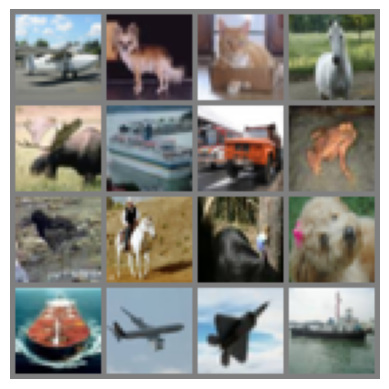

In [8]:
# Displaying some images

def imshow(img):
    img = img / 2 + 0.5  # Denormalize (undo the normalization)
    npimg = img.numpy()
    plt.imshow(np.transpose(npimg, (1, 2, 0)))
    plt.axis('off')
    plt.show()

dataiter = iter(data_loader)
images, labels = next(dataiter)

imshow(make_grid(images[:16], nrow=4))

**Model Architecture**

In [9]:
class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.model = nn.Sequential(
            nn.ConvTranspose2d(z_dim, 512, kernel_size=4, stride=1, padding=0, bias=False),
            nn.BatchNorm2d(512),
            nn.ReLU(True),

            nn.ConvTranspose2d(512, 256, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(256),
            nn.ReLU(True),

            nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(128),
            nn.ReLU(True),

            nn.ConvTranspose2d(128, channels, kernel_size=4, stride=2, padding=1, bias=False),
            nn.Tanh()
        )

    def forward(self, x):
        x = x.view(x.size(0), z_dim, 1, 1)
        x = self.model(x)
        return x

In [10]:
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.model = nn.Sequential(
            nn.Linear(channels * image_size * image_size, 1024),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(1024, 512),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(512, 256),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(256, 1),
            nn.Sigmoid()
        )

    def forward(self, x):
        x = x.view(x.size(0), -1)
        x = self.model(x)
        return x

**Training**

In [16]:
generator = Generator().cuda()
discriminator = Discriminator().cuda()

In [17]:
bce_loss = nn.BCELoss()
g_optimizer = optim.Adam(generator.parameters(), lr=lr, betas=(0.5, 0.999))
d_optimizer = optim.Adam(discriminator.parameters(), lr=lr, betas=(0.5, 0.999))

In [18]:
def track_gradient_norms(model, gradient_norms):
    total_norm = 0
    for p in model.parameters():
        if p.grad is not None:
            param_norm = p.grad.data.norm(2)
            total_norm += param_norm.item() ** 2
    gradient_norms.append(total_norm ** 0.5)

In [19]:
# Tracking metrics through the epochs
g_losses = []
d_losses = []
d_accuracies = []

g_gradient_norms = []
d_gradient_norms = []

checkpoint_path = '/content/drive/MyDrive/gen-ai/gan-results/gan-cifar-ckpt.pth'

In [20]:
for epoch in range(epochs):
    for i, (images, _) in enumerate(data_loader):
        batch_size = images.size(0)

        images = images.cuda()

        real_labels = torch.ones(batch_size, 1).cuda()
        fake_labels = torch.zeros(batch_size, 1).cuda()

        z = torch.randn(batch_size, z_dim).cuda()
        fake_images = generator(z)

        real_outputs = discriminator(images)
        fake_outputs = discriminator(fake_images.detach())

        d_loss_real = bce_loss(real_outputs, real_labels)
        d_loss_fake = bce_loss(fake_outputs, fake_labels)
        d_loss = d_loss_real + d_loss_fake

        d_optimizer.zero_grad()
        d_loss.backward()
        track_gradient_norms(discriminator, d_gradient_norms)
        d_optimizer.step()

        # Calculate discriminator accuracy
        real_correct = (real_outputs > 0.5).float().sum().item()
        fake_correct = (fake_outputs < 0.5).float().sum().item()
        real_total = images.size(0)
        fake_total = fake_images.size(0)
        d_accuracy = (real_correct + fake_correct) / (real_total + fake_total)

        z = torch.randn(batch_size, z_dim).cuda()
        fake_images = generator(z)
        outputs = discriminator(fake_images)

        g_loss = bce_loss(outputs, real_labels)

        g_optimizer.zero_grad()
        g_loss.backward()
        track_gradient_norms(generator, g_gradient_norms)
        g_optimizer.step()

        g_losses.append(g_loss.item())
        d_losses.append(d_loss.item())
        d_accuracies.append(d_accuracy)

    # Saving checkpoint at intervals
    if (epoch % 5 == 0 or epoch == (epochs-1)):
        ckpt = {
            'epoch': epoch,
            'g_model_state_dict': generator.state_dict(),
            'd_model_state_dict': discriminator.state_dict(),
            'g_optimizer_state_dict': g_optimizer.state_dict(),
            'd_optimizer_state_dict': d_optimizer.state_dict(),
        }
        torch.save(ckpt, checkpoint_path)
        print(f"Checkpoint saved at epoch {epoch} to {checkpoint_path}")

    print(f"Epoch [{epoch+1}/{epochs}], D Loss: {d_loss.item():.4f}, G Loss: {g_loss.item():.4f}, D Accuracy: {d_accuracy:.4f}")

    fake_images = fake_images.reshape(fake_images.size(0), channels, image_size, image_size)
    save_image(fake_images[:25], f"/content/drive/MyDrive/gen-ai/gan-results/output_{epoch+1}.png", nrow=5, normalize=True)

print("Training completed!")

Checkpoint saved at epoch 0 to /content/drive/MyDrive/gen-ai/gan-results/gan-cifar-ckpt.pth
Epoch [1/25], D Loss: 0.3874, G Loss: 2.8945, D Accuracy: 0.9000
Epoch [2/25], D Loss: 0.9878, G Loss: 1.8117, D Accuracy: 0.7500
Epoch [3/25], D Loss: 0.9957, G Loss: 1.3896, D Accuracy: 0.7125
Epoch [4/25], D Loss: 1.0782, G Loss: 1.3195, D Accuracy: 0.7438
Epoch [5/25], D Loss: 1.1250, G Loss: 1.1584, D Accuracy: 0.6625
Checkpoint saved at epoch 5 to /content/drive/MyDrive/gen-ai/gan-results/gan-cifar-ckpt.pth
Epoch [6/25], D Loss: 1.2848, G Loss: 0.9020, D Accuracy: 0.5875
Epoch [7/25], D Loss: 1.2008, G Loss: 1.0835, D Accuracy: 0.6750
Epoch [8/25], D Loss: 1.3225, G Loss: 0.9809, D Accuracy: 0.5500
Epoch [9/25], D Loss: 1.3506, G Loss: 0.8360, D Accuracy: 0.6062
Epoch [10/25], D Loss: 1.3043, G Loss: 0.8873, D Accuracy: 0.6125
Checkpoint saved at epoch 10 to /content/drive/MyDrive/gen-ai/gan-results/gan-cifar-ckpt.pth
Epoch [11/25], D Loss: 1.3161, G Loss: 0.7541, D Accuracy: 0.6062
Epoch 

**Generated Images**

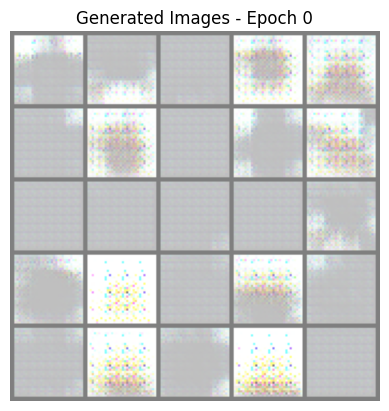

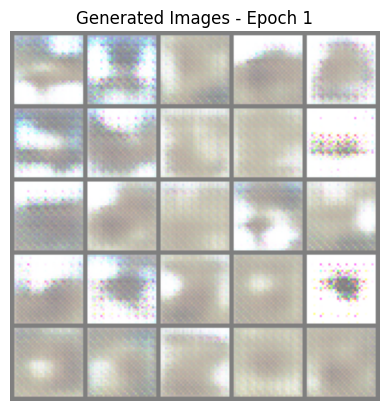

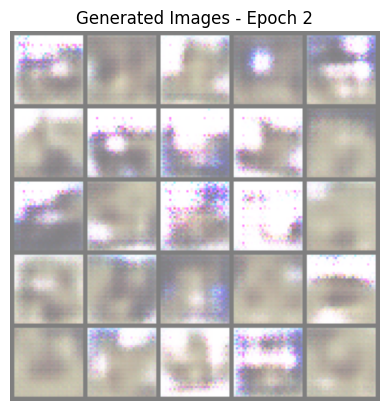

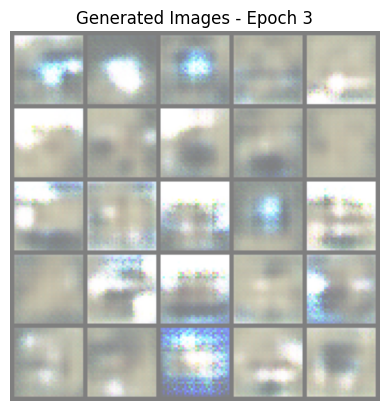

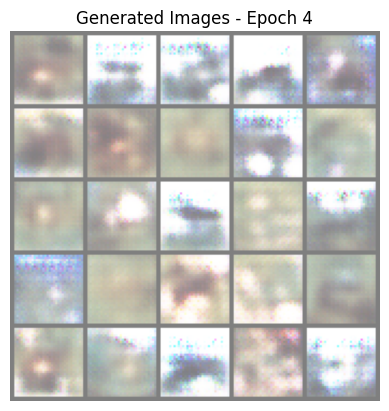

...

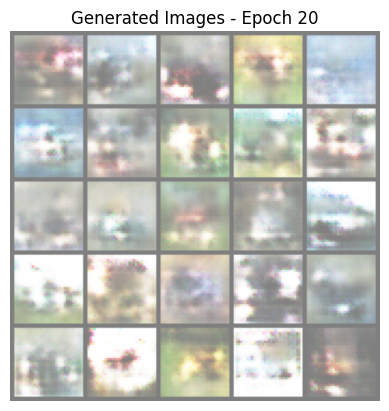

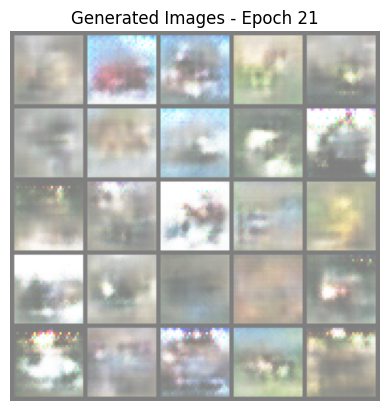

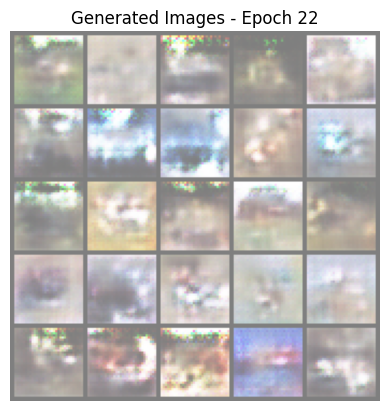

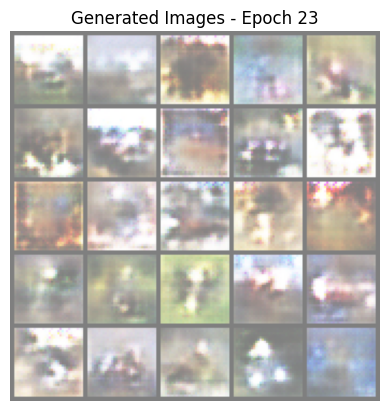

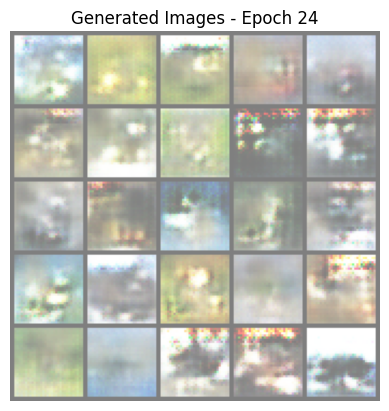

In [36]:
def denormalize(tensor):
    tensor = (tensor + 1) / 2
    tensor = tensor.clamp(0, 1)
    return tensor

def display_all_generated_images(epochs):
    for epoch in range(epochs):
        filename = f"/content/drive/MyDrive/gen-ai/gan-results/output_{epoch+1}.png"
        if os.path.exists(filename):
            img = Image.open(filename)
            img_tensor = torch.tensor(np.array(img), dtype=torch.float32) / 255.0
            img_tensor = denormalize(img_tensor)
            img_tensor = img_tensor.permute(2, 0, 1)

            plt.figure()
            plt.imshow(img_tensor.permute(1, 2, 0))
            plt.axis('off')
            plt.title(f"Generated Images - Epoch {epoch}")
            plt.show()

display_all_generated_images(epochs)

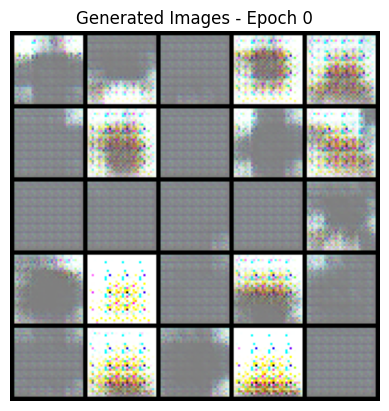

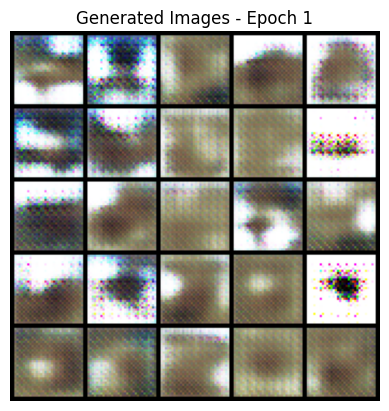

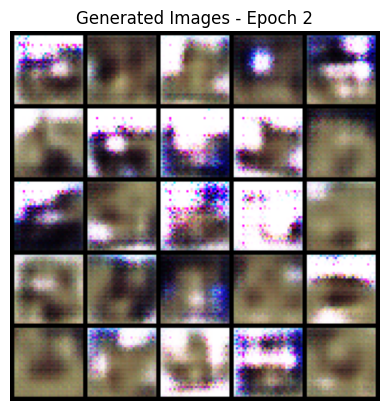

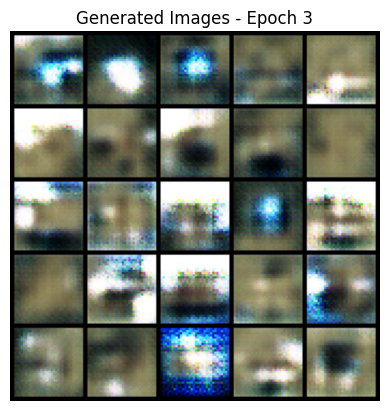

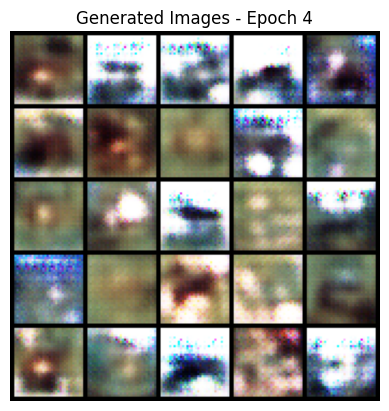

...

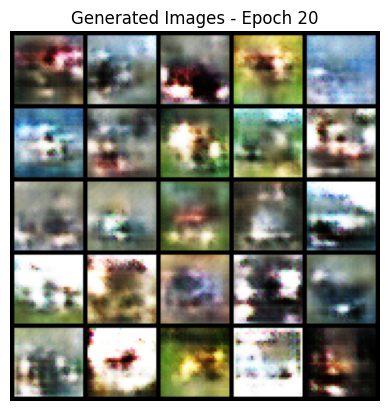

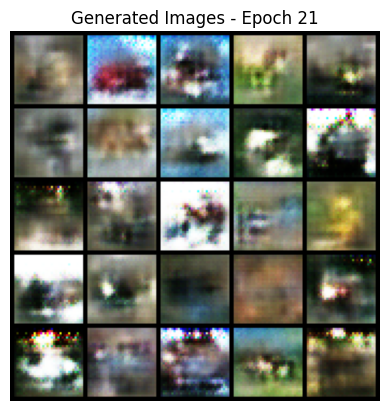

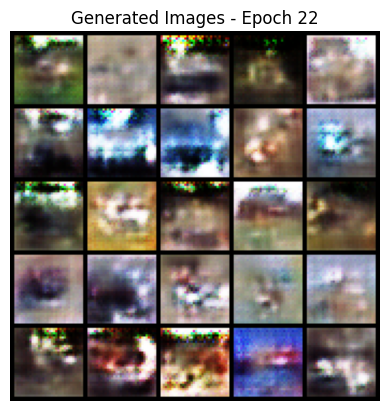

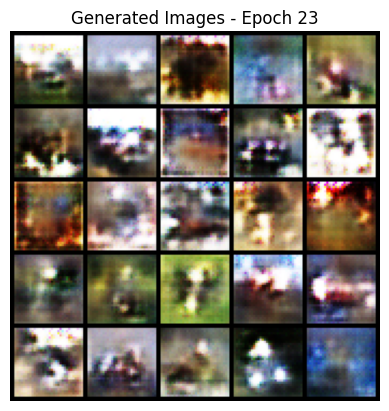

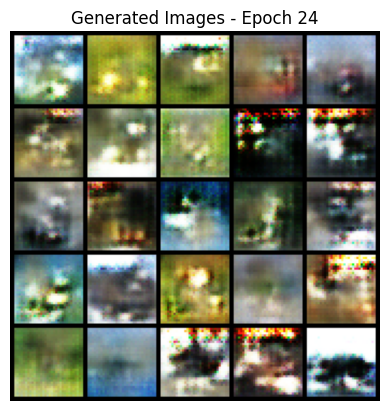

In [37]:
def display_all_generated_images(epochs):
    for epoch in range(epochs):
        filename = f"/content/drive/MyDrive/gen-ai/gan-results/output_{epoch+1}.png"
        if os.path.exists(filename):
            img = Image.open(filename)
            # img_tensor = torch.tensor(np.array(img), dtype=torch.float32) / 255.0
            # img_tensor = denormalize(img_tensor)
            # img_tensor = img_tensor.permute(2, 0, 1)

            plt.figure()
            plt.imshow(img)
            plt.axis('off')
            plt.title(f"Generated Images - Epoch {epoch}")
            plt.show()

display_all_generated_images(epochs)

In [22]:
# Saving metrics to disk

metrics_df = pd.DataFrame({
    "g_losses": g_losses,
    "d_losses": d_losses,
    "d_accuracies": d_accuracies,
    "g_gradient_norms": g_gradient_norms,
    "d_gradient_norms": d_gradient_norms
})

metrics_save_path = '/content/drive/MyDrive/gen-ai/gan-results/gan_cifar_metrics.csv'
metrics_df.to_csv(metrics_save_path, index=False)

In [23]:
# Reading metrics from disk

metrics_read_path = '/content/drive/MyDrive/gen-ai/gan-results/gan_cifar_metrics.csv'
metrics_df = pd.read_csv(metrics_read_path)

g_losses = metrics_df["g_losses"].tolist()
d_losses = metrics_df["d_losses"].tolist()
d_accuracies = metrics_df["d_accuracies"].tolist()
g_gradient_norms = metrics_df["g_gradient_norms"].tolist()
d_gradient_norms = metrics_df["d_gradient_norms"].tolist()

In [24]:
group_size = len(data_loader)

In [25]:
# Epoch-wise metrics for plotting
epoch_g_losses = []
epoch_d_losses = []
epoch_d_accuracies = []
epoch_g_gradient_norms = []
epoch_d_gradient_norms = []

for i in range(0, len(d_accuracies), group_size):
    chunk = g_losses[i:i + group_size]
    chunk_average = sum(chunk) / len(chunk)
    epoch_g_losses.append(chunk_average)

    chunk = d_losses[i:i + group_size]
    chunk_average = sum(chunk) / len(chunk)
    epoch_d_losses.append(chunk_average)

    chunk = d_accuracies[i:i + group_size]
    chunk_average = sum(chunk) / len(chunk)
    epoch_d_accuracies.append(chunk_average)

    chunk = g_gradient_norms[i:i + group_size]
    chunk_average = sum(chunk) / len(chunk)
    epoch_g_gradient_norms.append(chunk_average)

    chunk = d_gradient_norms[i:i + group_size]
    chunk_average = sum(chunk) / len(chunk)
    epoch_d_gradient_norms.append(chunk_average)

**Plotting**

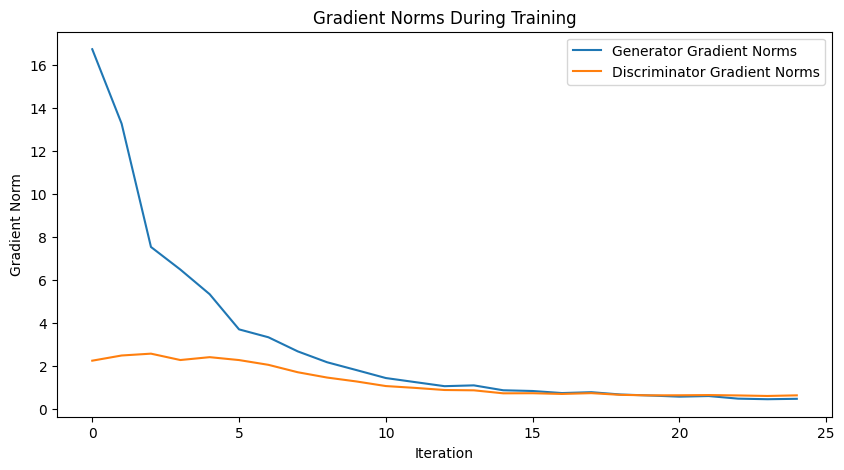

In [26]:
plt.figure(figsize=(10, 5))
plt.plot(epoch_g_gradient_norms, label="Generator Gradient Norms")
plt.plot(epoch_d_gradient_norms, label="Discriminator Gradient Norms")
plt.xlabel("Iteration")
plt.ylabel("Gradient Norm")
plt.legend()
plt.title("Gradient Norms During Training")
plt.show()

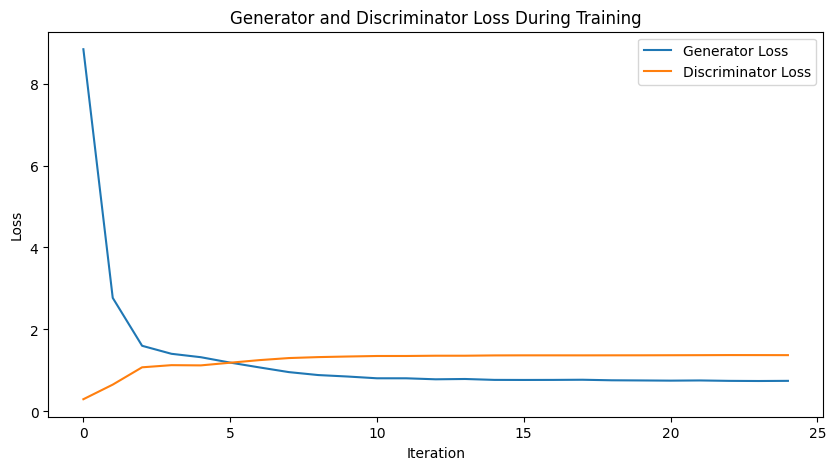

In [27]:
plt.figure(figsize=(10, 5))
plt.plot(epoch_g_losses, label="Generator Loss")
plt.plot(epoch_d_losses, label="Discriminator Loss")
plt.xlabel("Iteration")
plt.ylabel("Loss")
plt.legend()
plt.title("Generator and Discriminator Loss During Training")
plt.show()

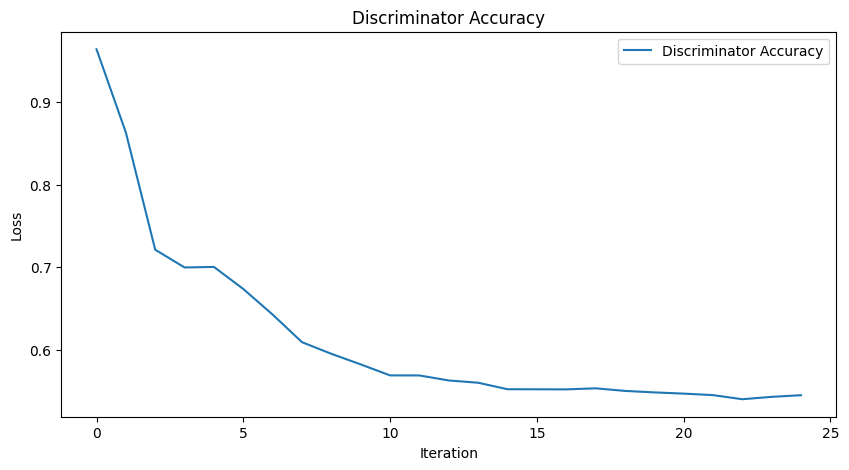

In [29]:
plt.figure(figsize=(10, 5))
plt.plot(epoch_d_accuracies, label="Discriminator Accuracy")
plt.xlabel("Iteration")
plt.ylabel("Loss")
plt.legend()
plt.title("Discriminator Accuracy")
plt.show()